In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import HTML
import time

from pydrake.all import (Variable, MathematicalProgram, OsqpSolver, Solve, SnoptSolver, eq)
from pydrake.solvers import branch_and_bound, gurobi
import pydrake.symbolic as sym

# Local module files
import environment, trajectory_gen, scenarios, animate, optimization, dynamics, simulation

## Define Dynamics Model (same nonlinear bicycle model from HW4)

#### State, Input Definitions and Nonlinear Equations of Motion

$
\dot{\mathbf{x}} = \left[\begin{array}{c} 
\dot{x} \\ \dot{y} \\ \dot{\phi} \\ \dot{v} \\ \dot{\psi}
\end{array}\right] = 
\left[\begin{array}{c} 
v cos(\phi) \\ v sin(\phi) \\ v tan(\psi) \\ u_1 \\ u_2
\end{array}\right] 
\quad
\mathbf{u} = \left[\begin{array}{c} 
\dot{v} \\ \dot{\psi} \\
\end{array}\right]
\quad
$


#### Linearization of dynamics about an operating point: 
$
x[n+1] = x[n] + f(x[n], u[n])dt \\
\\
\quad \text{Taking a 1st order Taylor approximation of } f(x[n], u[n]) \text{ about } \bar{x}[n], \bar{u}[n]: \\
\dot{x}[n] = f(x[n],u[n]) \approx f(\bar{x}[n],\bar{u}[n]) + \frac{\partial f}{\partial x}|_\bar{x} x[n] - \frac{\partial f}{\partial x}|_\bar{x} \bar{x}[n] + \frac{\partial f}{\partial u}|_\bar{u} u[n] - \frac{\partial f}{\partial u}|_\bar{u} \bar{u}[n] \\
\\
\quad \text{define: } \delta x = x[n] - \bar{x}[n] \\
f(x[n],u[n]) - f(\bar{x}[n],\bar{u}[n]) = \delta \dot{x} = \frac{\partial f}{\partial x}|_\bar{x} \delta x + \frac{\partial f}{\partial u}|_\bar{u} \delta u  = A \delta x + B \delta u \\
\\
\quad \text{And to compute state x[n+1]: } \\
x[n+1] = x[n] + f(x[n], u[n])dt = x[n] + [f(\bar{x}[n],\bar{u}[n]) + A \delta x + B \delta u]dt
$

Derivatives are computed symbolically using Drake in the `dynamics` module:

In [2]:
%psource dynamics.get_linear_dynamics

## Linear MPC solver
#### Dynamics Constraints - Direct Transcription
$ x[n+1] = x[n] + (f(\bar{x}[n],\bar{u}[n]) + A_n \delta x + B_n \delta u)dt  \quad n \in [0,N-1]$

where $A_n$, $B_n$ are the linearized error state parameters at each point $n$ in the trajectory horizon

#### Obstacle Constraints
For each polygonal obstacle with K sides, constraints take the form:
$cy \leq ax + b - G + Mz + q\\
\sum_{k \in K} z \leq K-1
$


where $G$ is the y-intercept offset computed to ensure a normal offset equal to the car's width W

and $z$ is a binary indicator variable to ensure that at least one obstcle halfspace constraint is active

and $q$ is a slack variable with high additive cost to ensure feasible solutions which penalize collisions

#### Input and State Constraints
$
a_{min} \leq \dot{v} \leq a_{max} \quad [m/s^2] \\
\dot{\psi}_{min} \leq \dot{\psi} \leq \dot{\psi}_{max} \quad [rad/s] \\
\psi_{min} \leq \psi \leq \psi_{max} \quad [rad] \\
0 \leq v \leq v_{max} \quad [m/s] \\
$


#### Cost Function
$
min_{x,u} \quad x_e^T Q_f x_e +  \sum_{n=0}^{N-1}  (x_e^T Q x_e + u^T R u) + L\sum q \\
\quad \quad \quad \text{where } x_e = x_{ref}[n] - x[n] \\
\quad \quad \quad \quad Q, Q_f, R \text{ are weight matrices} \\
\quad \quad \quad \quad L \text{ is a large constant weight for obstacle constraint slack variable } q \\
$


In [3]:
%psource optimization.linear_optimization

## Generate a test environment 
Referenced functions handle the following tasks:
- Define obstacles
- Reference path via waypoints
- C2 cubic spline interpolation
- Plotting functionality


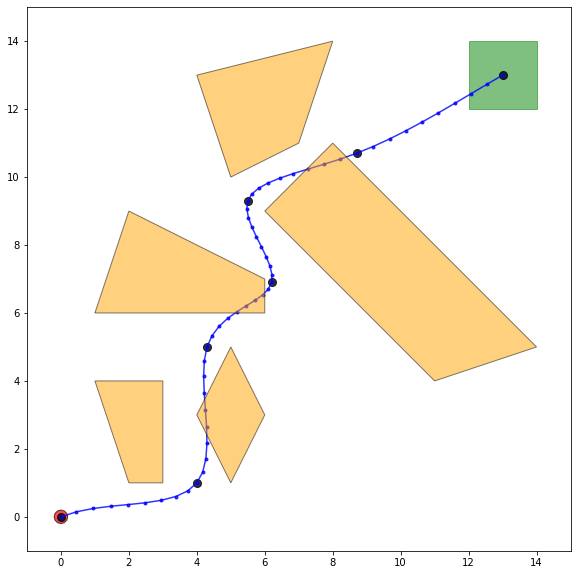

In [4]:
v   = 4.0   # avg velocity
dt  = 0.1   # interval step
N   = 20    # fixed horizon length
n_x = 5     # state dimension
n_u = 2     # control dimension

# scene = scenarios.two_obstacle
scene = scenarios.five_obstacle

# control_pts = scene['control_pts']
# bc_headings = scene['bc_headings']

control_pts = scene['control_pts_bad']
bc_headings = scene['bc_headings_bad']


env = environment.Environment(scene['obs_list'], scene['start'], scene['goal'])
env.add_control_points(control_pts)
fig, ax = environment.plot_environment(env, figsize=(16,10))
xc = [p[0] for p in control_pts]
yc = [p[1] for p in control_pts]
xs, ys, psi = trajectory_gen.sample_trajectory(control_pts, bc_headings, v, dt)
ax.plot(xs, ys, '-o', alpha=0.8, markersize=3, color='blue')

# create full sampled reference trajectory
nf = len(xs)
x_ref_full = np.vstack((xs.reshape((1,nf)), 
                        ys.reshape((1,nf)),
                        psi.reshape((1, nf)),
                        v*np.ones((1,nf)),
                        np.zeros((1,nf))))

x_ref = x_ref_full[:,0:N]
x0 = x_ref[:,0]

## Test optimization problem setup
Code in cell below runs a single step of the optimization with linearized dynamics, with zero additive noise, and with initial guess for control input initialized to zeros for all timesteps. Notice the nominal trajectory reflect this, and deviates substantially from the optimal/reference paths. Linearization error is high as a result. 

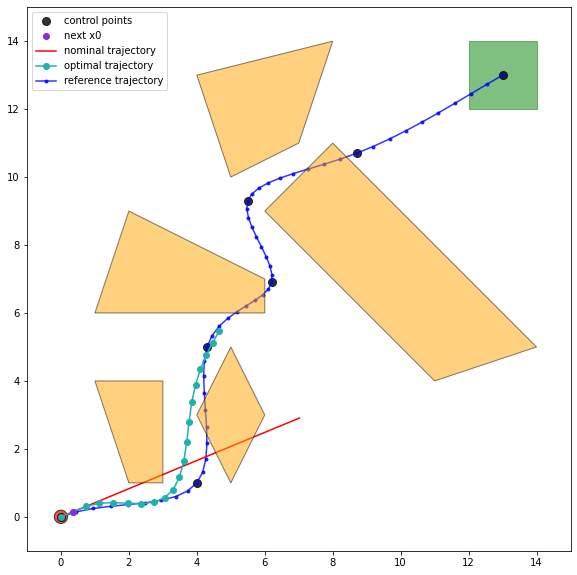

In [5]:
# Single linear optimization
u_bar = np.zeros((2,N-1))
u_opt = u_bar
x_bar = dynamics.rollout(x0, u_opt, n_x, dt)
result, (x_opt, u_opt, z_opt, v_opt) = optimization.linear_optimization(env, x_ref, x_bar, u_bar, x0, N, dt)

sigmas = np.zeros((5,))
u0 = u_opt[:,0]
x_next = dynamics.step_car_dynamics(x0, u0, sigmas, dt)

## Plot for one step of MPC
fig, ax = animate.plot_one_step(env, x_ref_full, x_bar, x_opt, x_next)

## Iterative Linear MPC
To deal with the linearization error and uncertainty in seeding the inital guess for $x_{bar}$ and $u_{bar}$ nominal trajectories, we can start by setting the inputs to zero and run the optimization problem iteratively, seeding each successive round with the optimal solution from the previous run, typically achieving convergence in a handful of cycles.

\* Implementation for iterative minimization of cost difference borrowed from  Atsushi Sakai's excellent [Python Robotics Repo ]( AtsushiSakai )

In [6]:
%psource optimization.iterative_linear_mpc

	 7  iterations, final control diff:  0.012483 , Elapsed time (s):  2.5734


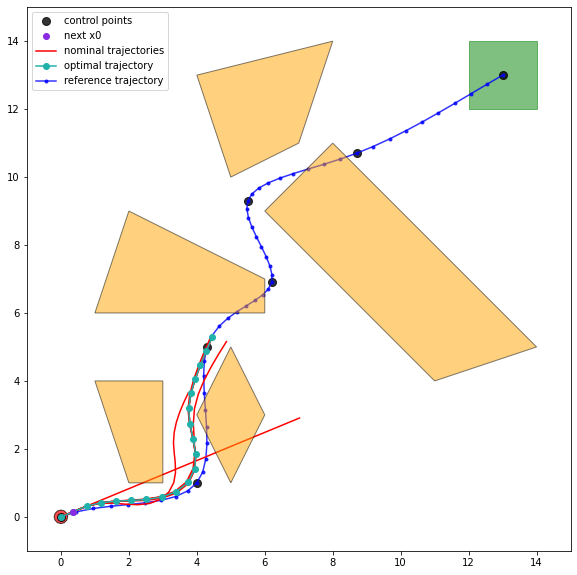

In [7]:
# Iterative Linear MPC - one step
result, (x_opt, u_opt, z_opt, v_opt), x_bar, nominals = optimization.iterative_linear_mpc(
    env, x_ref, None, None, x0, N, dt, max_iters=10)

sigmas = np.zeros((5,))
u0 = u_opt[:,0]
x_next = dynamics.step_car_dynamics(x0, u0, sigmas, dt)

fig, ax = animate.plot_one_step(env, x_ref_full, x_bar, x_opt, x_next, nominals)

## Simulate running MPC online

In [8]:
N = 10
sigmas = np.zeros((5,))
sim = {}
sim = simulation.simulate_lmpc(env, x_ref_full, sigmas, x0, N, dt, sim)

Step  0 / 55
	 5  iterations, final control diff:  0.092302 , Elapsed time (s):  0.3154
Step  1 / 55
	 4  iterations, final control diff:  0.028298 , Elapsed time (s):  0.2351
Step  2 / 55
	 4  iterations, final control diff:  0.011091 , Elapsed time (s):  0.2596
Step  3 / 55
	 5  iterations, final control diff:  0.01393 , Elapsed time (s):  0.4411
Step  4 / 55
	 4  iterations, final control diff:  0.034292 , Elapsed time (s):  0.3871
Step  5 / 55
	 4  iterations, final control diff:  0.016974 , Elapsed time (s):  0.4543
Step  6 / 55
	 4  iterations, final control diff:  0.016806 , Elapsed time (s):  0.4379
Step  7 / 55
	 4  iterations, final control diff:  0.035611 , Elapsed time (s):  0.5491
Step  8 / 55
	 3  iterations, final control diff:  0.012398 , Elapsed time (s):  0.3456
Step  9 / 55
	 3  iterations, final control diff:  0.00511 , Elapsed time (s):  0.3491
Step  10 / 55
	 2  iterations, final control diff:  0.023105 , Elapsed time (s):  0.2016
Step  11 / 55
	 2  iterations, fi

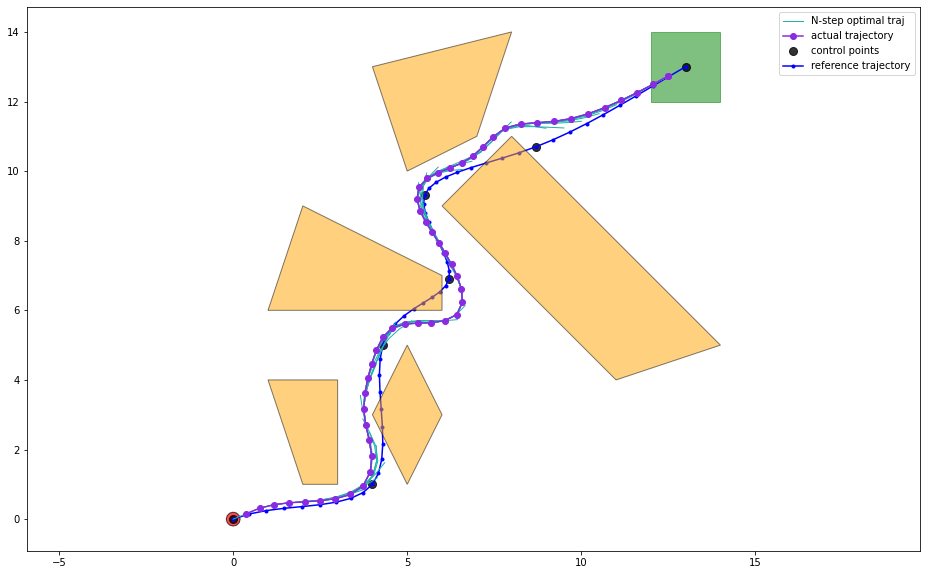

In [9]:
# Plot optimal traj at each timestep
fig, ax = animate.plot_all_steps(env, x_ref_full, sim)

In [10]:
## ANIMATION
anim = animate.animate(env, control_pts, bc_headings, v, dt, x_ref_full, sim, rect=True)
anim

In [11]:
# Write out animation to file
filename = 'five_obs_no_noise_01'
anim.save('./vids/'+filename+'.mp4', writer='ffmpeg', fps=5)

## Simulate a different environment


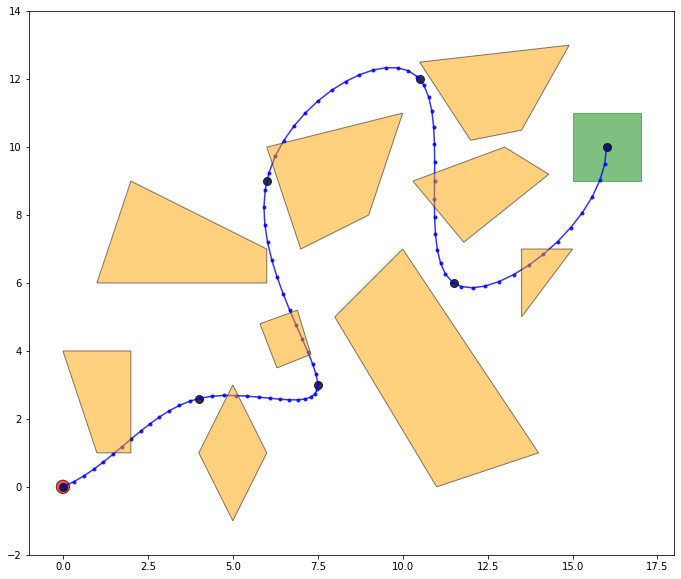

In [12]:
# New environment
v   = 4.0   # avg velocity
dt  = 0.1   # interval step
N   = 20    # fixed horizon length
n_x = 5     # state dimension
n_u = 2     # control dimension


scene = scenarios.nine_obstacle

control_pts = scene['control_pts']
bc_headings = scene['bc_headings']


env = environment.Environment(scene['obs_list'], scene['start'], scene['goal'])
env.add_control_points(control_pts)
fig, ax = environment.plot_environment(env, figsize=(16,10))
xc = [p[0] for p in control_pts]
yc = [p[1] for p in control_pts]
xs, ys, psi = trajectory_gen.sample_trajectory(control_pts, bc_headings, v, dt)
ax.plot(xs, ys, '-o', alpha=0.8, markersize=3, color='blue')

# create full sampled reference trajectory
nf = len(xs)
x_ref_full = np.vstack((xs.reshape((1,nf)), 
                        ys.reshape((1,nf)),
                        psi.reshape((1, nf)),
                        v*np.ones((1,nf)),
                        np.zeros((1,nf))))

x_ref = x_ref_full[:,0:N]
x0 = x_ref[:,0]

In [13]:
N = 10
# sigmas = np.array([0.05, 0.05, 0.01, 0.05, 0.01])
sigmas = np.zeros((5,))
sim = {}
sim = simulation.simulate_lmpc(env, x_ref_full, sigmas, x0, N, dt, sim)

Step  0 / 84
	 5  iterations, final control diff:  0.149563 , Elapsed time (s):  0.52
Step  1 / 84
	 5  iterations, final control diff:  0.022571 , Elapsed time (s):  0.4973
Step  2 / 84
	 4  iterations, final control diff:  0.032814 , Elapsed time (s):  0.4181
Step  3 / 84
	 5  iterations, final control diff:  0.084031 , Elapsed time (s):  0.5247
Step  4 / 84
	 5  iterations, final control diff:  0.123691 , Elapsed time (s):  0.4788
Step  5 / 84
	 5  iterations, final control diff:  0.230714 , Elapsed time (s):  0.4892
Step  6 / 84
	 4  iterations, final control diff:  0.049968 , Elapsed time (s):  0.6155
Step  7 / 84
	 5  iterations, final control diff:  0.184653 , Elapsed time (s):  0.732
Step  8 / 84
	 4  iterations, final control diff:  0.023707 , Elapsed time (s):  0.6343
Step  9 / 84
	 5  iterations, final control diff:  0.008512 , Elapsed time (s):  0.7263
Step  10 / 84
	 5  iterations, final control diff:  0.013511 , Elapsed time (s):  0.7307
Step  11 / 84
	 3  iterations, fin

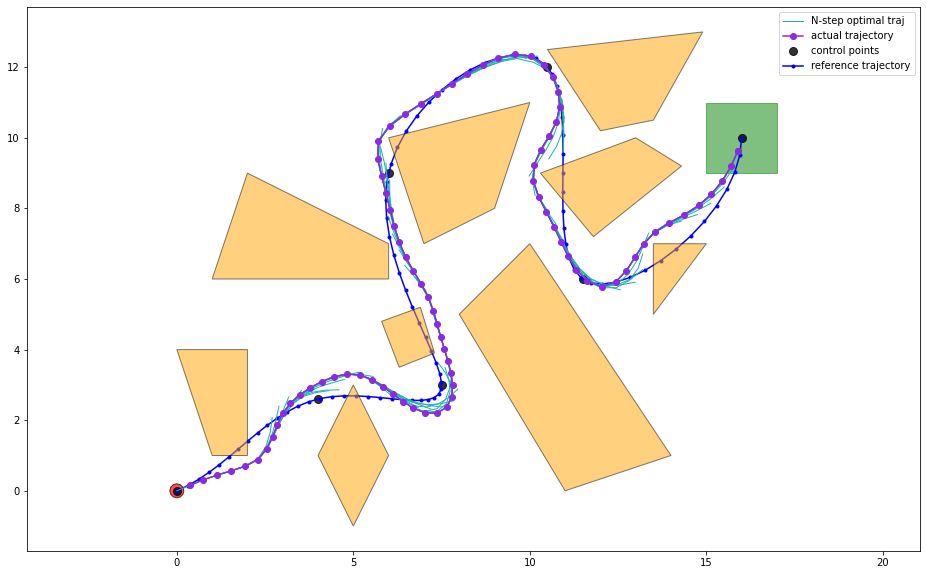

In [14]:
# Plot optimal traj at each timestep
fig, ax = animate.plot_all_steps(env, x_ref_full, sim)

In [15]:
## ANIMATION
anim = animate.animate(env, control_pts, bc_headings, v, dt, x_ref_full, sim, rect=True)
anim

In [16]:
# Write out animation to file
filename = 'nine_obs_no_noise'
anim.save('./vids/'+filename+'.mp4', writer='ffmpeg', fps=5)